In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.offline import iplot


from sklearn.model_selection import train_test_split
from math import sqrt
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error as mse
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
import warnings
from sklearn.preprocessing import StandardScaler, MinMaxScaler

In [2]:
train_df=pd.read_csv('train.csv')
test_df=pd.read_csv('test.csv')
features_df=pd.read_csv('features.csv')
stores_df=pd.read_csv('stores.csv')


In [3]:
train_df.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday
0,1,1,2010-02-05,24924.50,False
1,1,1,2010-02-12,46039.49,True
2,1,1,2010-02-19,41595.55,False
3,1,1,2010-02-26,19403.54,False
4,1,1,2010-03-05,21827.90,False


In [4]:
train_df.shape

(421570, 5)

In [5]:
train_df.columns

Index(['Store', 'Dept', 'Date', 'Weekly_Sales', 'IsHoliday'], dtype='object')

In [6]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 421570 entries, 0 to 421569
Data columns (total 5 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   Store         421570 non-null  int64  
 1   Dept          421570 non-null  int64  
 2   Date          421570 non-null  object 
 3   Weekly_Sales  421570 non-null  float64
 4   IsHoliday     421570 non-null  bool   
dtypes: bool(1), float64(1), int64(2), object(1)
memory usage: 13.3+ MB


In [7]:
train_df.describe()

,Store,Dept,Weekly_Sales
count,421570.000000,421570.000000,421570.000000
mean,22.200546,44.260317,15981.258123
std,12.785297,30.492054,22711.183519
min,1.000000,1.000000,-4988.940000
25%,11.000000,18.000000,2079.650000
50%,22.000000,37.000000,7612.030000
75%,33.000000,74.000000,20205.852500
max,45.000000,99.000000,693099.360000


In [8]:
train_df.isnull().sum()

Store           0
Dept            0
Date            0
Weekly_Sales    0
IsHoliday       0
dtype: int64

In [9]:
features_df.head()

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday
0,1,2010-02-05,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False
1,1,2010-02-12,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True
2,1,2010-02-19,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False
3,1,2010-02-26,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False
4,1,2010-03-05,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False


In [10]:
features_df.shape

(8190, 12)

In [11]:
features_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8190 entries, 0 to 8189
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         8190 non-null   int64  
 1   Date          8190 non-null   object 
 2   Temperature   8190 non-null   float64
 3   Fuel_Price    8190 non-null   float64
 4   MarkDown1     4032 non-null   float64
 5   MarkDown2     2921 non-null   float64
 6   MarkDown3     3613 non-null   float64
 7   MarkDown4     3464 non-null   float64
 8   MarkDown5     4050 non-null   float64
 9   CPI           7605 non-null   float64
 10  Unemployment  7605 non-null   float64
 11  IsHoliday     8190 non-null   bool   
dtypes: bool(1), float64(9), int64(1), object(1)
memory usage: 712.0+ KB


In [12]:
features_df.describe()

,Store,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment
count,8190.000000,8190.000000,8190.000000,4032.000000,2921.000000,3613.000000,3464.000000,4050.000000,7605.000000,7605.000000
mean,23.000000,59.356198,3.405992,7032.371786,3384.176594,1760.100180,3292.935886,4132.216422,172.460809,7.826821
std,12.987966,18.678607,0.431337,9262.747448,8793.583016,11276.462208,6792.329861,13086.690278,39.738346,1.877259
min,1.000000,-7.290000,2.472000,-2781.450000,-265.760000,-179.260000,0.220000,-185.170000,126.064000,3.684000
25%,12.000000,45.902500,3.041000,1577.532500,68.880000,6.600000,304.687500,1440.827500,132.364839,6.634000
50%,23.000000,60.710000,3.513000,4743.580000,364.570000,36.260000,1176.425000,2727.135000,182.764003,7.806000
75%,34.000000,73.880000,3.743000,8923.310000,2153.350000,163.150000,3310.007500,4832.555000,213.932412,8.567000
max,45.000000,101.950000,4.468000,103184.980000,104519.540000,149483.310000,67474.850000,771448.100000,228.976456,14.313000


In [13]:
features_df.isnull().sum()

Store              0
Date               0
Temperature        0
Fuel_Price         0
MarkDown1       4158
MarkDown2       5269
MarkDown3       4577
MarkDown4       4726
MarkDown5       4140
CPI              585
Unemployment     585
IsHoliday          0
dtype: int64

In [14]:
stores_df.head()

,Store,Type,Size
0,1,A,151315
1,2,A,202307
2,3,B,37392
3,4,A,205863
4,5,B,34875


In [15]:
stores_df.columns

Index(['Store', 'Type', 'Size'], dtype='object')

In [16]:
stores_df.shape

(45, 3)

In [17]:
stores_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45 entries, 0 to 44
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Store   45 non-null     int64 
 1   Type    45 non-null     object
 2   Size    45 non-null     int64 
dtypes: int64(2), object(1)
memory usage: 1.2+ KB


In [18]:
stores_df.describe()

,Store,Size
count,45.000000,45.000000
mean,23.000000,130287.600000
std,13.133926,63825.271991
min,1.000000,34875.000000
25%,12.000000,70713.000000
50%,23.000000,126512.000000
75%,34.000000,202307.000000
max,45.000000,219622.000000


In [19]:
stores_df.isnull().sum()

Store    0
Type     0
Size     0
dtype: int64

visualizing the type of stores along with their precentage


In [20]:
labels=stores_df['Type'].value_counts()[:10].index #taking the top 10 values
values=stores_df['Type'].value_counts()[:10].values

colors=stores_df["Type"]

fig=go.Figure(data=[go.Pie(labels=labels,values=values,textinfo="label+percent",marker=dict(colors=colors))])
fig.show()

type A has max no of stores
since features and stores have "Store" common columns so we will merge the data


In [21]:
dataset=features_df.merge(stores_df,how="inner" ,on="Store")
dataset.head()

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday,Type,Size
0,1,2010-02-05,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False,A,151315
1,1,2010-02-12,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True,A,151315
2,1,2010-02-19,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False,A,151315
3,1,2010-02-26,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False,A,151315
4,1,2010-03-05,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False,A,151315


In [22]:
stores_df.head()

,Store,Type,Size
0,1,A,151315
1,2,A,202307
2,3,B,37392
3,4,A,205863
4,5,B,34875


In [25]:
stores_df.shape

(45, 3)

In [24]:
features_df.shape

(8190, 12)

In [23]:
dataset.shape

(8190, 14)

In [26]:
#total no of columns in the dataset
dataset.columns

Index(['Store', 'Date', 'Temperature', 'Fuel_Price', 'MarkDown1', 'MarkDown2',
       'MarkDown3', 'MarkDown4', 'MarkDown5', 'CPI', 'Unemployment',
       'IsHoliday', 'Type', 'Size'],
      dtype='object')

In [26]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8190 entries, 0 to 8189
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         8190 non-null   int64  
 1   Date          8190 non-null   object 
 2   Temperature   8190 non-null   float64
 3   Fuel_Price    8190 non-null   float64
 4   MarkDown1     4032 non-null   float64
 5   MarkDown2     2921 non-null   float64
 6   MarkDown3     3613 non-null   float64
 7   MarkDown4     3464 non-null   float64
 8   MarkDown5     4050 non-null   float64
 9   CPI           7605 non-null   float64
 10  Unemployment  7605 non-null   float64
 11  IsHoliday     8190 non-null   bool   
 12  Type          8190 non-null   object 
 13  Size          8190 non-null   int64  
dtypes: bool(1), float64(9), int64(2), object(2)
memory usage: 839.9+ KB


since the date in dataset is string we can convert it into datetime using datetime

In [27]:
dataset.describe()

,Store,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,Size
count,8190.000000,8190.000000,8190.000000,4032.000000,2921.000000,3613.000000,3464.000000,4050.000000,7605.000000,7605.000000,8190.000000
mean,23.000000,59.356198,3.405992,7032.371786,3384.176594,1760.100180,3292.935886,4132.216422,172.460809,7.826821,130287.600000
std,12.987966,18.678607,0.431337,9262.747448,8793.583016,11276.462208,6792.329861,13086.690278,39.738346,1.877259,63115.971429
min,1.000000,-7.290000,2.472000,-2781.450000,-265.760000,-179.260000,0.220000,-185.170000,126.064000,3.684000,34875.000000
25%,12.000000,45.902500,3.041000,1577.532500,68.880000,6.600000,304.687500,1440.827500,132.364839,6.634000,70713.000000
50%,23.000000,60.710000,3.513000,4743.580000,364.570000,36.260000,1176.425000,2727.135000,182.764003,7.806000,126512.000000
75%,34.000000,73.880000,3.743000,8923.310000,2153.350000,163.150000,3310.007500,4832.555000,213.932412,8.567000,202307.000000
max,45.000000,101.950000,4.468000,103184.980000,104519.540000,149483.310000,67474.850000,771448.100000,228.976456,14.313000,219622.000000


visualizing the type of stores along with their percentage in dataset

In [28]:
labels=dataset['Type'].value_counts()[:10].index #taking the top 10 values
values=dataset['Type'].value_counts()[:10].values

colors=dataset["Type"]

fig=go.Figure(data=[go.Pie(labels=labels,values=values,textinfo="label+percent",marker=dict(colors=colors))])
fig.show()

In [29]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115064 entries, 0 to 115063
Data columns (total 4 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   Store      115064 non-null  int64 
 1   Dept       115064 non-null  int64 
 2   Date       115064 non-null  object
 3   IsHoliday  115064 non-null  bool  
dtypes: bool(1), int64(2), object(1)
memory usage: 2.7+ MB


visualizing the top 10 department in train dataset along with their percentage

In [30]:
labels=train_df['Dept'].value_counts()[:10].index #taking the top 10 values
values=train_df['Dept'].value_counts()[:10].values

colors=train_df["Dept"]

fig=go.Figure(data=[go.Pie(labels=labels,values=values,textinfo="label+percent",marker=dict(colors=colors))])
fig.show()

visualizing the top 10 stores in train

In [31]:
labels=train_df['Store'].value_counts()[:10].index #taking the top 10 values
values=train_df['Store'].value_counts()[:10].values

colors=train_df["Store"]

fig=go.Figure(data=[go.Pie(labels=labels,values=values,textinfo="label+percent",marker=dict(colors=colors))])
fig.show()

visualizing the isHoliday data


In [32]:
labels=train_df['IsHoliday'].value_counts().index #taking the top 10 values
values=train_df['IsHoliday'].value_counts().values

colors=train_df["IsHoliday"]

fig=go.Figure(data=[go.Pie(labels=labels,values=values,textinfo="label+percent",marker=dict(colors=colors))])
fig.show()

In [33]:
test_df.columns

Index(['Store', 'Dept', 'Date', 'IsHoliday'], dtype='object')

In [34]:
test_df.describe()

,Store,Dept
count,115064.000000,115064.000000
mean,22.238207,44.339524
std,12.809930,30.656410
min,1.000000,1.000000
25%,11.000000,18.000000
50%,22.000000,37.000000
75%,33.000000,74.000000
max,45.000000,99.000000


In [35]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 421570 entries, 0 to 421569
Data columns (total 5 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   Store         421570 non-null  int64  
 1   Dept          421570 non-null  int64  
 2   Date          421570 non-null  object 
 3   Weekly_Sales  421570 non-null  float64
 4   IsHoliday     421570 non-null  bool   
dtypes: bool(1), float64(1), int64(2), object(1)
memory usage: 13.3+ MB


In [37]:
from datetime import datetime
dataset['Date']=pd.to_datetime(dataset['Date'],format='%Y-%m-%d')
train_df['Date']=pd.to_datetime(train_df['Date'],format='%Y-%m-%d')
test_df['Date']=pd.to_datetime(test_df['Date'],format='%Y-%m-%d')

In [38]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 421570 entries, 0 to 421569
Data columns (total 5 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   Store         421570 non-null  int64         
 1   Dept          421570 non-null  int64         
 2   Date          421570 non-null  datetime64[ns]
 3   Weekly_Sales  421570 non-null  float64       
 4   IsHoliday     421570 non-null  bool          
dtypes: bool(1), datetime64[ns](1), float64(1), int64(2)
memory usage: 13.3 MB


In [39]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8190 entries, 0 to 8189
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Store         8190 non-null   int64         
 1   Date          8190 non-null   datetime64[ns]
 2   Temperature   8190 non-null   float64       
 3   Fuel_Price    8190 non-null   float64       
 4   MarkDown1     4032 non-null   float64       
 5   MarkDown2     2921 non-null   float64       
 6   MarkDown3     3613 non-null   float64       
 7   MarkDown4     3464 non-null   float64       
 8   MarkDown5     4050 non-null   float64       
 9   CPI           7605 non-null   float64       
 10  Unemployment  7605 non-null   float64       
 11  IsHoliday     8190 non-null   bool          
 12  Type          8190 non-null   object        
 13  Size          8190 non-null   int64         
dtypes: bool(1), datetime64[ns](1), float64(9), int64(2), object(1)
memory usage: 839.9+ KB


In [40]:
dataset['Year']=dataset.Date.dt.year
#dataset['Month']=dataset.Date.dt.month
#dataset['Day']=dataset.Date.dt.day
dataset['WeekOfYear']=dataset.Date.dt.isocalendar().week

In [41]:
dataset.head()

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday,Type,Size,Year,WeekOfYear
0,1,2010-02-05,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False,A,151315,2010,5
1,1,2010-02-12,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True,A,151315,2010,6
2,1,2010-02-19,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False,A,151315,2010,7
3,1,2010-02-26,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False,A,151315,2010,8
4,1,2010-03-05,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False,A,151315,2010,9


merge with train_df

In [36]:
train_merge=train_df.merge(dataset,how="inner",on=["Store","Date","IsHoliday"]).sort_values(by=['Store','Dept','Date']).reset_index(drop=True)

In [37]:
train_merge.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,Type,Size
0,1,1,2010-02-05,24924.50,False,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,A,151315
1,1,1,2010-02-12,46039.49,True,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,A,151315
2,1,1,2010-02-19,41595.55,False,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,A,151315
3,1,1,2010-02-26,19403.54,False,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,A,151315
4,1,1,2010-03-05,21827.90,False,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,A,151315


In [38]:
train_merge.shape

(421570, 16)

In [39]:
train_merge

,Store,Dept,Date,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,Type,Size
0,1,1,2010-02-05,24924.50,False,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,A,151315
1,1,1,2010-02-12,46039.49,True,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,A,151315
2,1,1,2010-02-19,41595.55,False,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,A,151315
3,1,1,2010-02-26,19403.54,False,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,A,151315
4,1,1,2010-03-05,21827.90,False,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,A,151315
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
421565,45,98,2012-09-28,508.37,False,64.88,3.997,4556.61,20.64,1.50,1601.01,3288.25,192.013558,8.684,B,118221
421566,45,98,2012-10-05,628.10,False,64.89,3.985,5046.74,NaN,18.82,2253.43,2340.01,192.170412,8.667,B,118221
421567,45,98,2012-10-12,1061.02,False,54.47,4.000,1956.28,NaN,7.89,599.32,3990.54,192.327265,8.667,B,118221
421568,45,98,2012-10-19,760.01,False,56.47,3.969,2004.02,NaN,3.18,437.73,1537.49,192.330854,8.667,B,118221


In [40]:
test_merge=test_df.merge(dataset,how="inner",on=["Store","Date","IsHoliday"]).sort_values(by=['Store','Dept','Date']).reset_index(drop=True)

In [41]:
test_merge.shape

(115064, 15)

In [42]:
test_merge.head()

,Store,Dept,Date,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,Type,Size
0,1,1,2012-11-02,False,55.32,3.386,6766.44,5147.70,50.82,3639.90,2737.42,223.462779,6.573,A,151315
1,1,1,2012-11-09,False,61.24,3.314,11421.32,3370.89,40.28,4646.79,6154.16,223.481307,6.573,A,151315
2,1,1,2012-11-16,False,52.92,3.252,9696.28,292.10,103.78,1133.15,6612.69,223.512911,6.573,A,151315
3,1,1,2012-11-23,True,56.23,3.211,883.59,4.17,74910.32,209.91,303.32,223.561947,6.573,A,151315
4,1,1,2012-11-30,False,52.34,3.207,2460.03,NaN,3838.35,150.57,6966.34,223.610984,6.573,A,151315


In [44]:
def scatter(train_merge,column):
  plt.figure()
  plt.scatter(train_merge[column],train_merge['Weekly_Sales'])
  plt.ylabel("Weekly_Sales")
  plt.xlabel(column)
  plt.show()

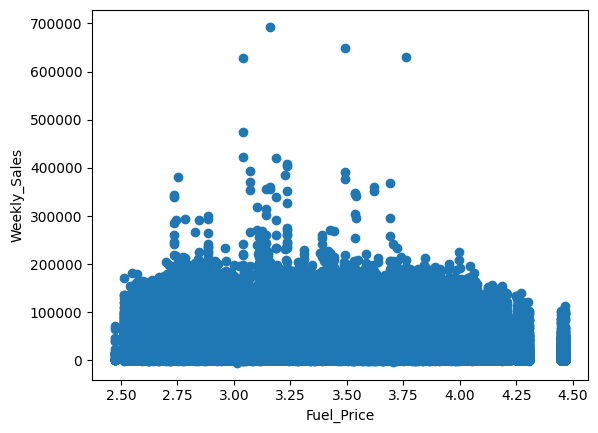

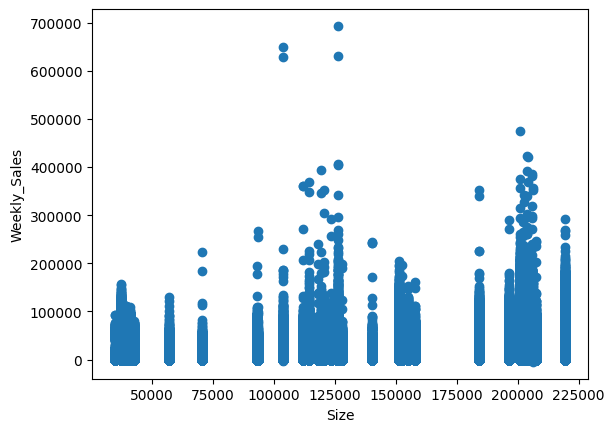

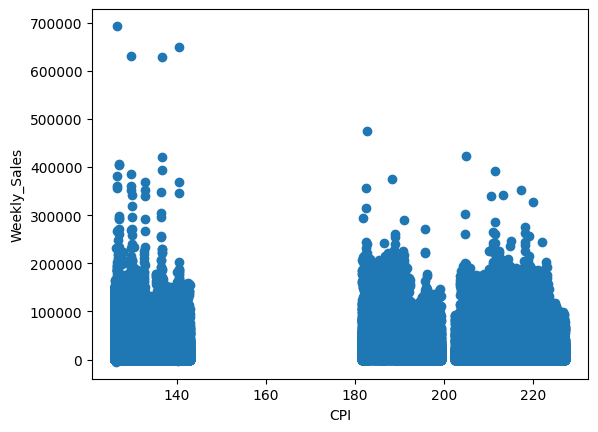

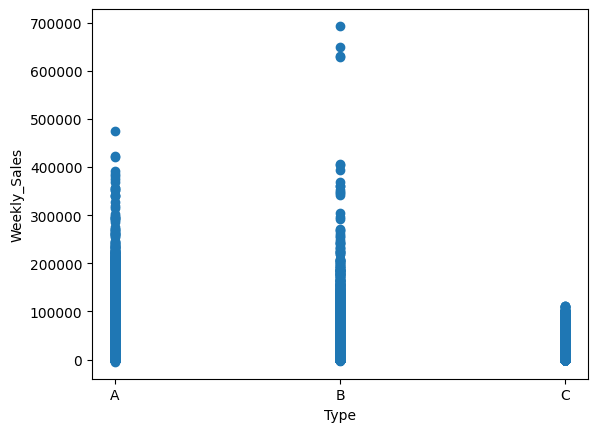

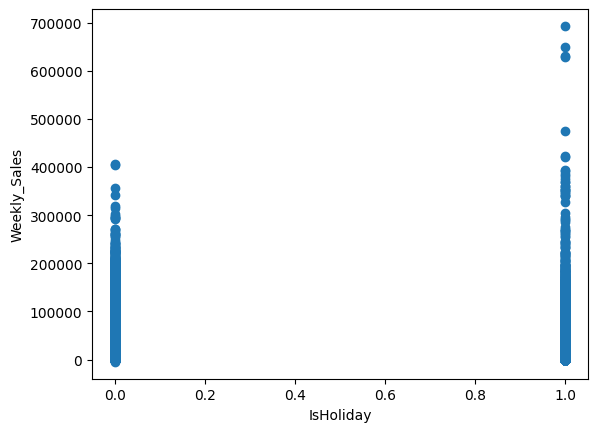

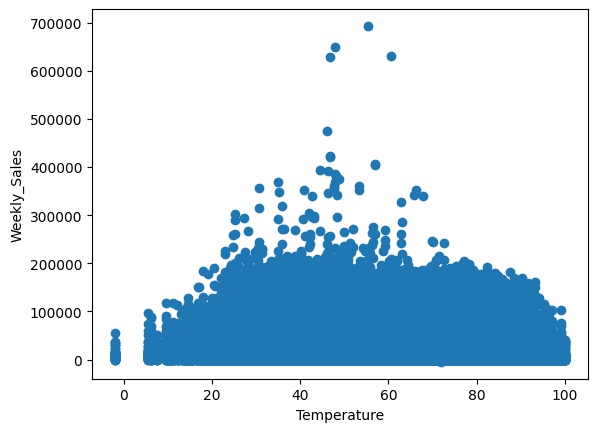

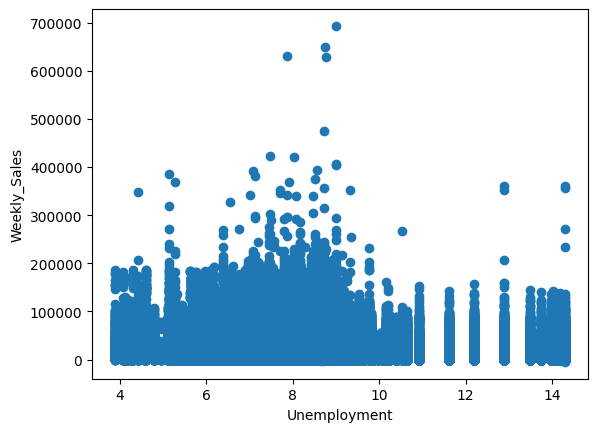

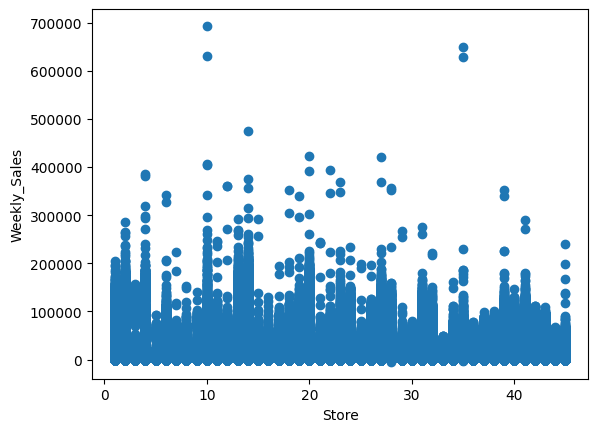

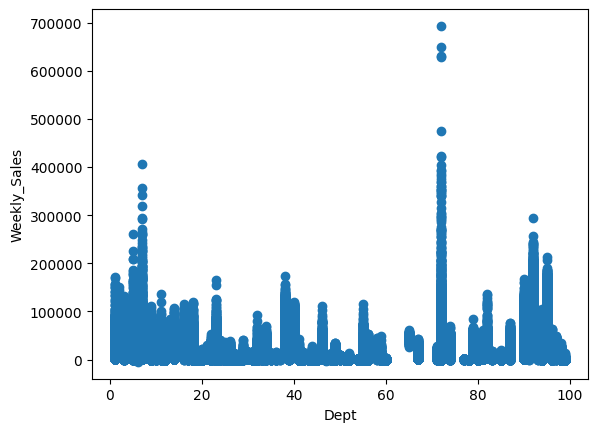

In [45]:
scatter(train_merge,'Fuel_Price')
scatter(train_merge,'Size')
scatter(train_merge,'CPI')
scatter(train_merge,'Type')
scatter(train_merge,'IsHoliday')
scatter(train_merge,'Temperature')
scatter(train_merge,'Unemployment')
scatter(train_merge,'Store')
scatter(train_merge,'Dept')



In [46]:
#correlation matrix


lets have a look at the avergae weekly sales per year and find out if there is any other peak sales that were not considered by "ISHoliday" field

In [47]:
weekly_sales_2010=train_merge[train_merge['Year']==2010]['Weekly_Sales'].groupby(train_merge['WeekOfYear']).mean()

<Axes: xlabel='WeekOfYear'>

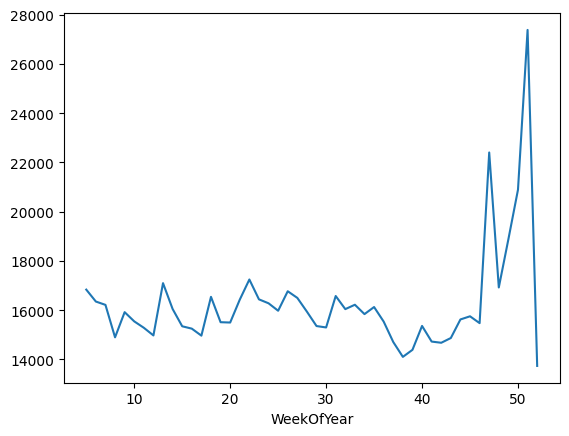

In [48]:
sns.lineplot(x=weekly_sales_2010.index,y=weekly_sales_2010.values)

<Axes: xlabel='WeekOfYear'>

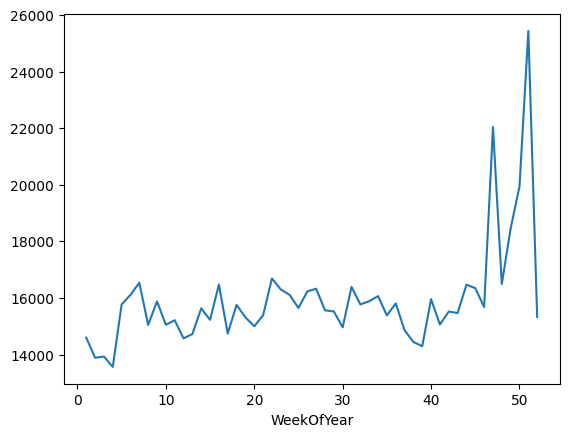

In [49]:
weekly_sales_2011=train_merge[train_merge['Year']==2011]['Weekly_Sales'].groupby(train_merge['WeekOfYear']).mean()
sns.lineplot(x=weekly_sales_2011.index,y=weekly_sales_2011.values)

<Axes: xlabel='WeekOfYear'>

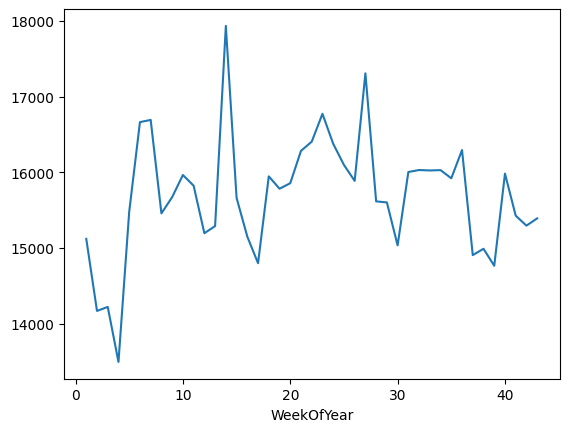

In [50]:
weekly_sales_2012=train_merge[train_merge['Year']==2012]['Weekly_Sales'].groupby(train_merge['WeekOfYear']).mean()
sns.lineplot(x=weekly_sales_2012.index,y=weekly_sales_2012.values)

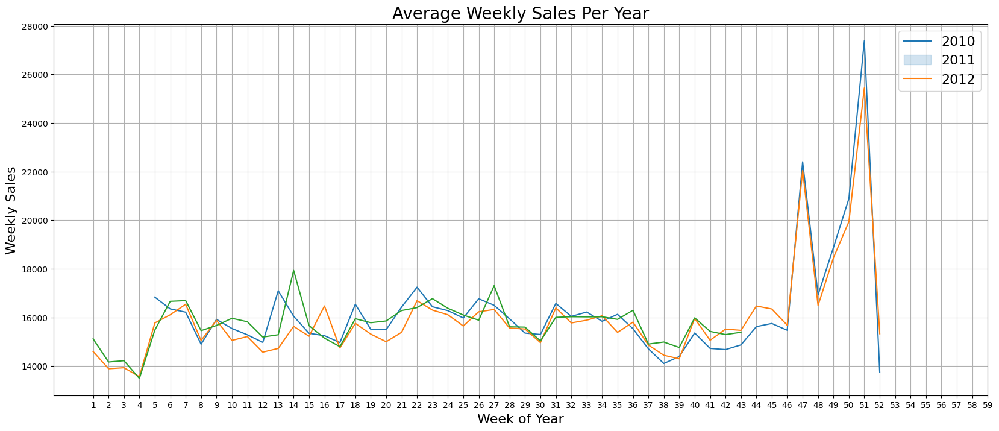

In [51]:
#plooting the above 3 topether
plt.figure(figsize=(20,8))
sns.lineplot(x=weekly_sales_2010.index,y=weekly_sales_2010.values)
sns.lineplot(x=weekly_sales_2011.index,y=weekly_sales_2011.values)
sns.lineplot(x=weekly_sales_2012.index,y=weekly_sales_2012.values)
plt.grid()
plt.xticks(np.arange(1,60,step=1))
plt.legend(['2010','2011','2012'],loc='best',fontsize=16)
plt.title('Average Weekly Sales Per Year',fontsize=20)
plt.ylabel('Weekly Sales',fontsize=16)
plt.xlabel('Week of Year',fontsize=16)
plt.show()

/tmp/ipython-input-55-1268807964.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




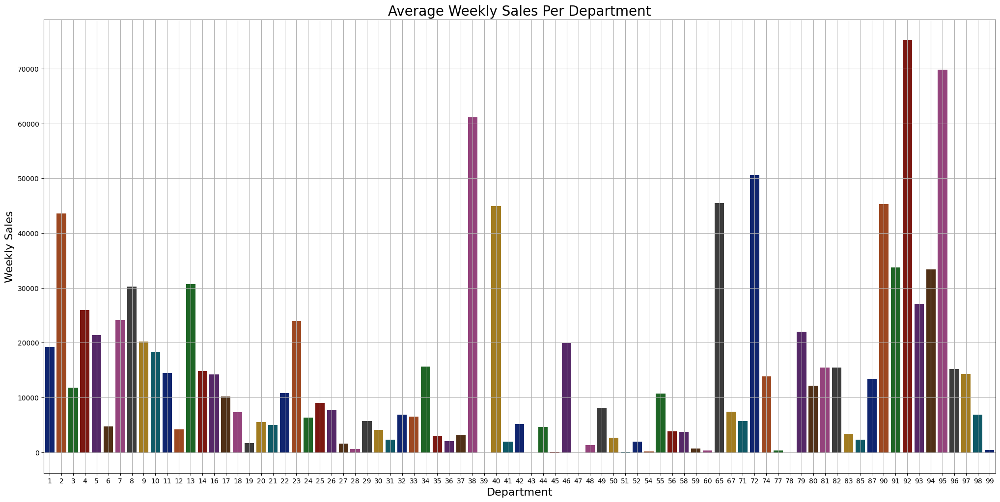

In [55]:
weekly_sales=train_merge['Weekly_Sales'].groupby(train_merge['Dept']).mean()
plt.figure(figsize=(25,12))
sns.barplot(x=weekly_sales.index,y=weekly_sales.values,palette='dark')
plt.grid()
plt.title('Average Weekly Sales Per Department',fontsize=20)
plt.ylabel('Weekly Sales',fontsize=16)
plt.xlabel('Department',fontsize=16)
#plt.xticks(rotation=90)
plt.show()

/tmp/ipython-input-56-4221399431.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




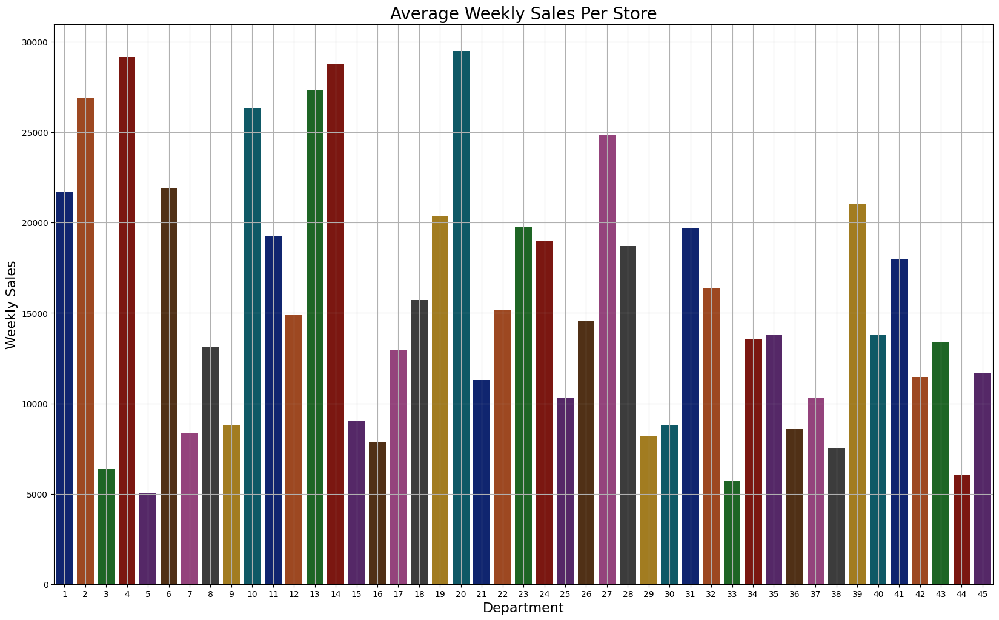

In [56]:
weekly_sales=train_merge['Weekly_Sales'].groupby(train_merge['Store']).mean()
plt.figure(figsize=(20,12))
sns.barplot(x=weekly_sales.index,y=weekly_sales.values, palette='dark')
plt.grid()
plt.title('Average Weekly Sales Per Store',fontsize=20)
plt.ylabel('Weekly Sales',fontsize=16)
plt.xlabel('Department',fontsize=16)
#plt.xticks(rotation=90)
plt.show()

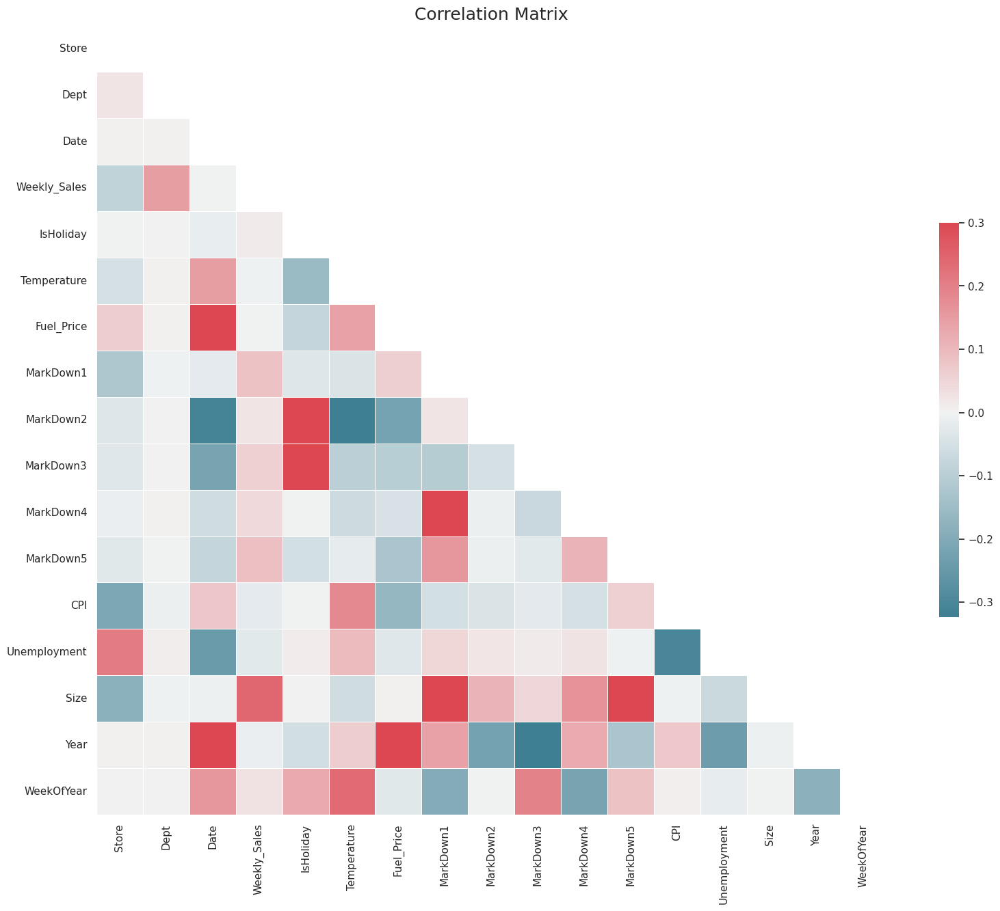

In [60]:
sns.set(style='white')
# Drop the 'Type' column before calculating correlation
corr=train_merge.drop('Type', axis=1).corr()
mask=np.triu(np.ones_like(corr,dtype=np.bool))
f,ax=plt.subplots(figsize=(20,15))
cmap=sns.diverging_palette(220,10,as_cmap=True)
plt.title("Correlation Matrix",fontsize=18)
sns.heatmap(corr,mask=mask,cmap=cmap,vmax=.3,center=0,square=True,linewidths=.5,cbar_kws={"shrink":.5})
plt.show()

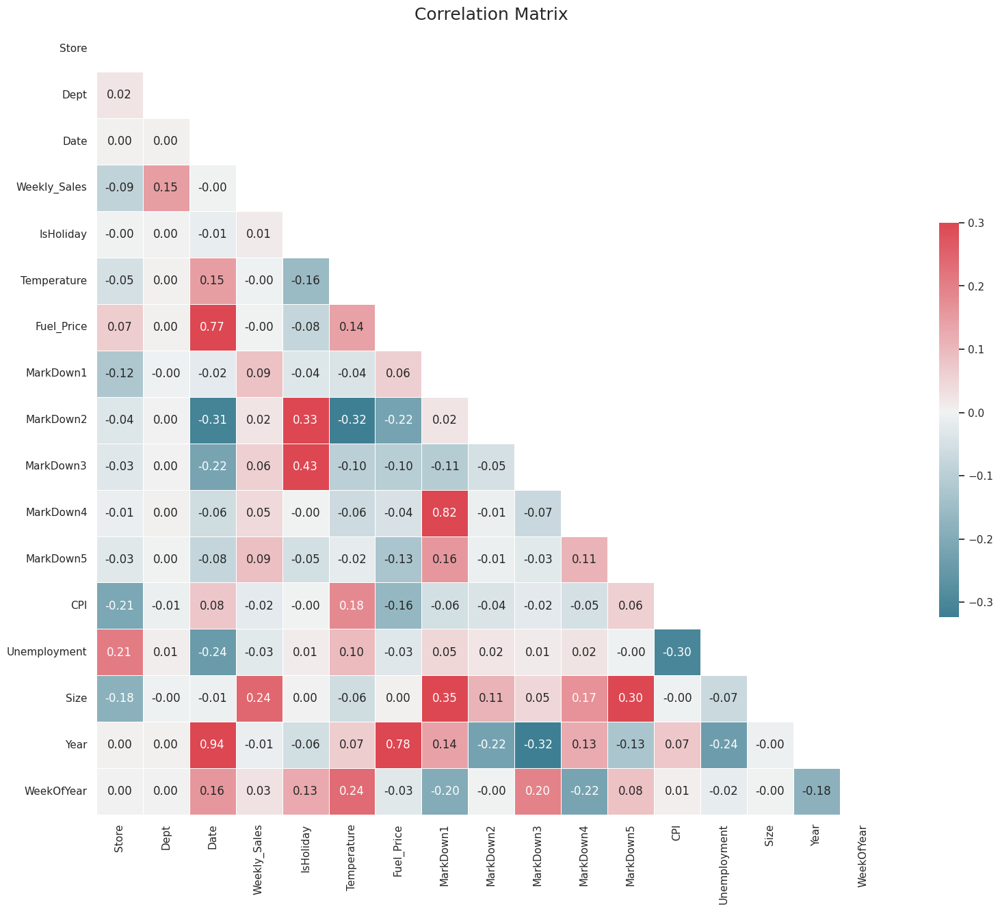

In [59]:
# prompt: i want corelated values to be inside boxes in above correlation matrix

import matplotlib.pyplot as plt
import numpy as np
sns.set(style='white')
# Drop the 'Type' column before calculating correlation
corr=train_merge.drop('Type', axis=1).corr()
mask=np.triu(np.ones_like(corr,dtype=bool))
f,ax=plt.subplots(figsize=(20,15))
cmap=sns.diverging_palette(220,10,as_cmap=True)
plt.title("Correlation Matrix",fontsize=18)

# Annotate the heatmap with correlation values
sns.heatmap(corr,mask=mask,cmap=cmap,vmax=.3,center=0,square=True,linewidths=.5,cbar_kws={"shrink":.5}, annot=True, fmt=".2f")

plt.show()


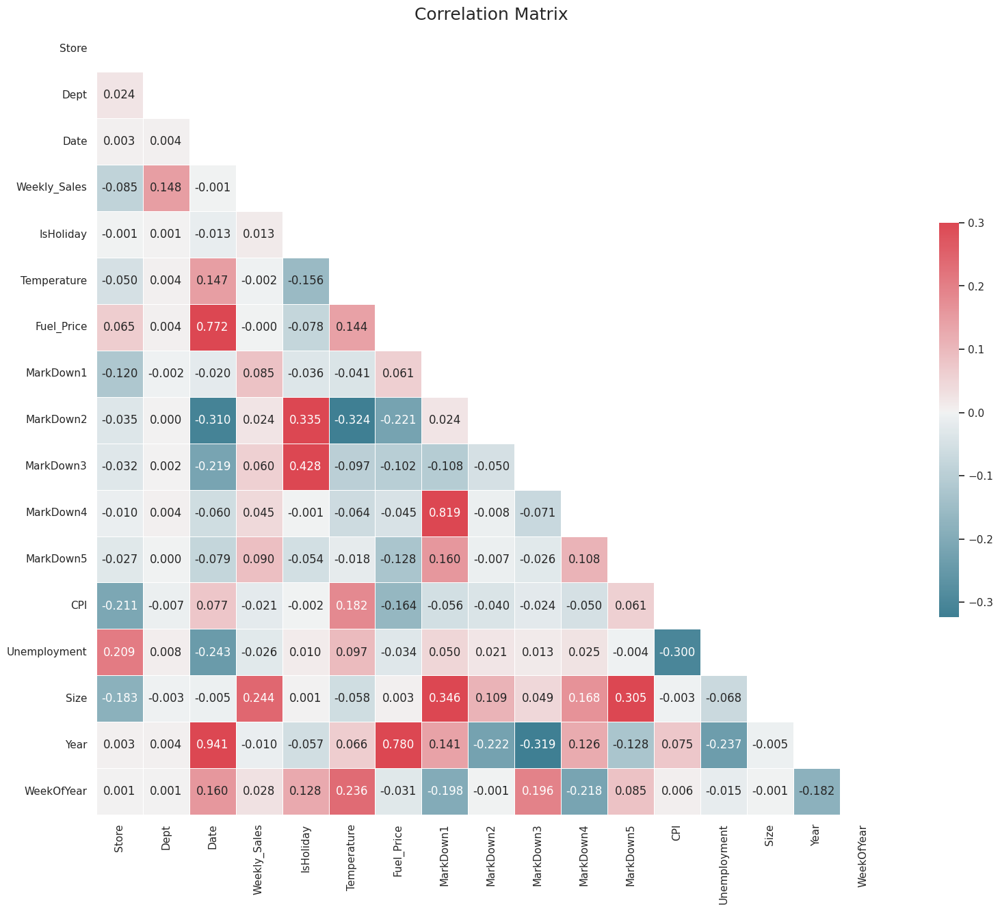

In [62]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

sns.set(style='white')

# Drop the 'Type' column before calculating correlation
corr = train_merge.drop('Type', axis=1).corr()

# Mask the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(20, 15))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with 5 decimal places
sns.heatmap(
    corr,
    mask=mask,
    cmap=cmap,
    vmax=.3,
    center=0,
    square=True,
    linewidths=.5,
    cbar_kws={"shrink": .5},
    annot=True,
    fmt=".3f"  # Show 5 decimal places
)

plt.title("Correlation Matrix", fontsize=18)
plt.show()


In [43]:
#droping the variable that have week corelation
train_merge=train_merge.drop(columns=['MarkDown1','MarkDown2','MarkDown3','MarkDown4','MarkDown5'])
test_merge=test_merge.drop(columns=['MarkDown1','MarkDown2','MarkDown3','MarkDown4','MarkDown5'])

In [44]:
train_merge.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,CPI,Unemployment,Type,Size
0,1,1,2010-02-05,24924.50,False,42.31,2.572,211.096358,8.106,A,151315
1,1,1,2010-02-12,46039.49,True,38.51,2.548,211.242170,8.106,A,151315
2,1,1,2010-02-19,41595.55,False,39.93,2.514,211.289143,8.106,A,151315
3,1,1,2010-02-26,19403.54,False,46.63,2.561,211.319643,8.106,A,151315
4,1,1,2010-03-05,21827.90,False,46.50,2.625,211.350143,8.106,A,151315


In [45]:
train_merge

,Store,Dept,Date,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,CPI,Unemployment,Type,Size
0,1,1,2010-02-05,24924.50,False,42.31,2.572,211.096358,8.106,A,151315
1,1,1,2010-02-12,46039.49,True,38.51,2.548,211.242170,8.106,A,151315
2,1,1,2010-02-19,41595.55,False,39.93,2.514,211.289143,8.106,A,151315
3,1,1,2010-02-26,19403.54,False,46.63,2.561,211.319643,8.106,A,151315
4,1,1,2010-03-05,21827.90,False,46.50,2.625,211.350143,8.106,A,151315
...,...,...,...,...,...,...,...,...,...,...,...
421565,45,98,2012-09-28,508.37,False,64.88,3.997,192.013558,8.684,B,118221
421566,45,98,2012-10-05,628.10,False,64.89,3.985,192.170412,8.667,B,118221
421567,45,98,2012-10-12,1061.02,False,54.47,4.000,192.327265,8.667,B,118221
421568,45,98,2012-10-19,760.01,False,56.47,3.969,192.330854,8.667,B,118221


In [50]:
# Convert 'Date' to datetime if not already, then extract week of year and drop 'Date'
train_merge['WeekOfYear'] = pd.to_datetime(train_merge['Date']).dt.isocalendar().week
train_merge = train_merge.drop(columns=['Date'])

In [51]:
train_merge.head()

,Store,Dept,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,CPI,Unemployment,Type,Size,WeekOfYear
0,1,1,24924.50,False,42.31,2.572,211.096358,8.106,A,151315,5
1,1,1,46039.49,True,38.51,2.548,211.242170,8.106,A,151315,6
2,1,1,41595.55,False,39.93,2.514,211.289143,8.106,A,151315,7
3,1,1,19403.54,False,46.63,2.561,211.319643,8.106,A,151315,8
4,1,1,21827.90,False,46.50,2.625,211.350143,8.106,A,151315,9


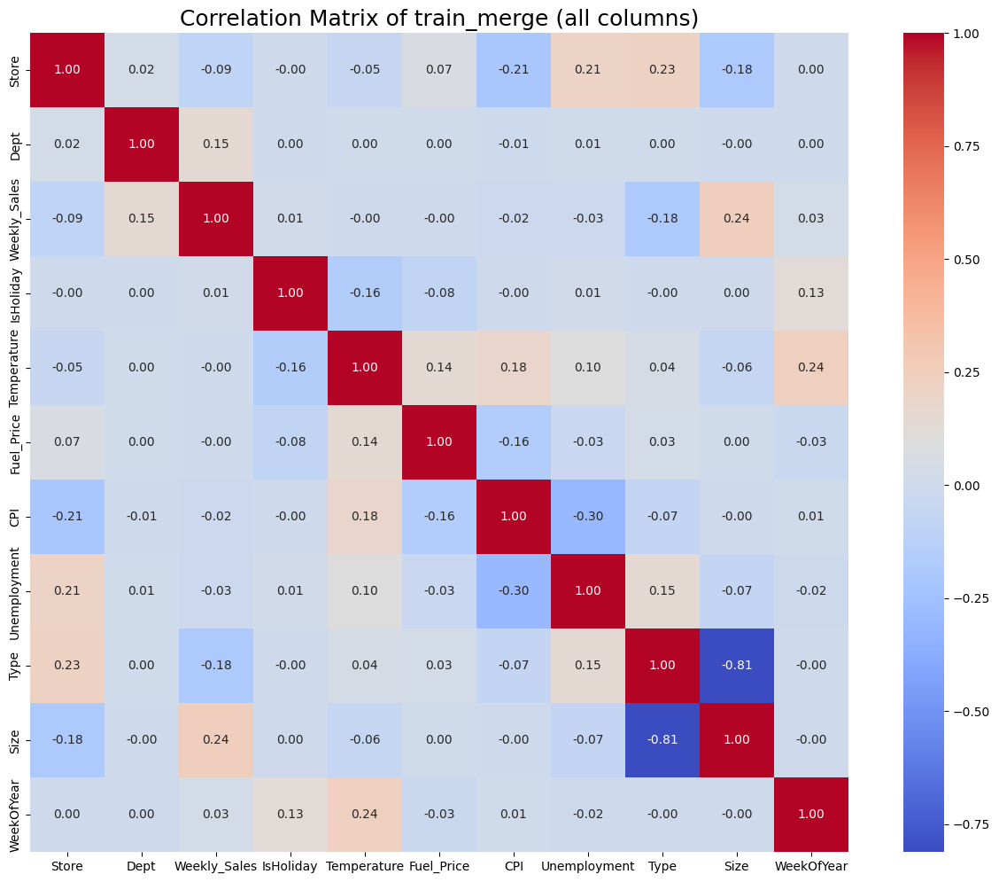

In [52]:
import seaborn as sns

# Plot correlation matrix for all columns of train_merge (including 'Type' as categorical)
import matplotlib.pyplot as plt

# Encode 'Type' if it's not numeric
train_corr = train_merge.copy()
if train_corr['Type'].dtype == object:
    train_corr['Type'] = train_corr['Type'].map(type_mapping)

corr_matrix = train_corr.corr()

plt.figure(figsize=(16, 12))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True)
plt.title("Correlation Matrix of train_merge (all columns)", fontsize=18)
plt.show()

In [46]:
test_merge.head()

,Store,Dept,Date,IsHoliday,Temperature,Fuel_Price,CPI,Unemployment,Type,Size
0,1,1,2012-11-02,False,55.32,3.386,223.462779,6.573,A,151315
1,1,1,2012-11-09,False,61.24,3.314,223.481307,6.573,A,151315
2,1,1,2012-11-16,False,52.92,3.252,223.512911,6.573,A,151315
3,1,1,2012-11-23,True,56.23,3.211,223.561947,6.573,A,151315
4,1,1,2012-11-30,False,52.34,3.207,223.610984,6.573,A,151315


In [59]:
# Prepare test_merge for prediction by aligning features with train_merge (excluding 'Weekly_Sales')
# 1. Ensure categorical variables are encoded the same way as in training
# 2. Align columns and handle missing values if necessary

# Encode 'Type' as in train_merge
type_mapping = {'A': 0, 'B': 1, 'C': 2}
train_merge['Type'] = train_merge['Type'].map(type_mapping)



In [54]:
train_merge.head()

,Store,Dept,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,CPI,Unemployment,Type,Size,WeekOfYear
0,1,1,24924.50,False,42.31,2.572,211.096358,8.106,0,151315,5
1,1,1,46039.49,True,38.51,2.548,211.242170,8.106,0,151315,6
2,1,1,41595.55,False,39.93,2.514,211.289143,8.106,0,151315,7
3,1,1,19403.54,False,46.63,2.561,211.319643,8.106,0,151315,8
4,1,1,21827.90,False,46.50,2.625,211.350143,8.106,0,151315,9


now train merge is ready as training dataset


In [55]:
test_merge

,Store,Dept,Date,IsHoliday,Temperature,Fuel_Price,CPI,Unemployment,Type,Size
0,1,1,2012-11-02,False,55.32,3.386,223.462779,6.573,0,151315
1,1,1,2012-11-09,False,61.24,3.314,223.481307,6.573,0,151315
2,1,1,2012-11-16,False,52.92,3.252,223.512911,6.573,0,151315
3,1,1,2012-11-23,True,56.23,3.211,223.561947,6.573,0,151315
4,1,1,2012-11-30,False,52.34,3.207,223.610984,6.573,0,151315
...,...,...,...,...,...,...,...,...,...,...
115059,45,98,2013-06-28,False,76.05,3.639,NaN,NaN,1,118221
115060,45,98,2013-07-05,False,77.50,3.614,NaN,NaN,1,118221
115061,45,98,2013-07-12,False,79.37,3.614,NaN,NaN,1,118221
115062,45,98,2013-07-19,False,82.84,3.737,NaN,NaN,1,118221


In [61]:
# The 'Type' column in test_merge is NaN because when merging, the 'Type' column in stores_df was of type object (A, B, C),
# but after mapping in train_merge and test_merge, it was converted to numeric (0, 1, 2).
# However, in test_merge, the merge was done before mapping, so the mapping should be applied after merging.

# Fix: Map 'Type' in test_merge using type_mapping, but first fill missing values from stores_df if needed

# Merge 'Type' from stores_df into test_merge based on 'Store'
test_merge = test_merge.drop(columns=['Type'], errors='ignore')  # Remove existing 'Type' if present
test_merge = test_merge.merge(stores_df[['Store', 'Type']], on='Store', how='left')

# Map 'Type' to numeric using type_mapping
test_merge['Type'] = test_merge['Type'].map(type_mapping)

# Update X_test as well if needed
X_test['Type'] = test_merge['Type']

test_merge.head()

C:\Users\HP\AppData\Local\Temp\ipykernel_17152\509809886.py:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Store,Dept,Date,IsHoliday,Temperature,Fuel_Price,CPI,Unemployment,Size,Type
0,1,1,2012-11-02,False,55.32,3.386,223.462779,6.573,151315,0
1,1,1,2012-11-09,False,61.24,3.314,223.481307,6.573,151315,0
2,1,1,2012-11-16,False,52.92,3.252,223.512911,6.573,151315,0
3,1,1,2012-11-23,True,56.23,3.211,223.561947,6.573,151315,0
4,1,1,2012-11-30,False,52.34,3.207,223.610984,6.573,151315,0


In [62]:
test_merge.head()

,Store,Dept,Date,IsHoliday,Temperature,Fuel_Price,CPI,Unemployment,Size,Type
0,1,1,2012-11-02,False,55.32,3.386,223.462779,6.573,151315,0
1,1,1,2012-11-09,False,61.24,3.314,223.481307,6.573,151315,0
2,1,1,2012-11-16,False,52.92,3.252,223.512911,6.573,151315,0
3,1,1,2012-11-23,True,56.23,3.211,223.561947,6.573,151315,0
4,1,1,2012-11-30,False,52.34,3.207,223.610984,6.573,151315,0


In [63]:
# Select features used for training (excluding 'Weekly_Sales' and 'Date')
features = ['Store', 'Dept', 'IsHoliday', 'Temperature', 'Fuel_Price', 'CPI', 'Unemployment', 'Type', 'Size']

# Handle missing values (fill with median or another strategy)
test_merge_prepared = test_merge.copy()
for col in ['CPI', 'Unemployment']:
    test_merge_prepared[col] = test_merge_prepared[col].fillna(test_merge_prepared[col].median())

X_test = test_merge_prepared[features]
X_test.head()

,Store,Dept,IsHoliday,Temperature,Fuel_Price,CPI,Unemployment,Type,Size
0,1,1,False,55.32,3.386,223.462779,6.573,0,151315
1,1,1,False,61.24,3.314,223.481307,6.573,0,151315
2,1,1,False,52.92,3.252,223.512911,6.573,0,151315
3,1,1,True,56.23,3.211,223.561947,6.573,0,151315
4,1,1,False,52.34,3.207,223.610984,6.573,0,151315


In [7]:
# train_and_save_model.py

import pandas as pd
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
import pickle

# Load datasets
train = pd.read_csv("train.csv")
features = pd.read_csv("features.csv")
stores = pd.read_csv("stores.csv")

# Merge data
df = train.merge(features, on=["Store", "Date"], how="left")
df = df.merge(stores, on="Store", how="left")

# Clean and preprocess
df["Date"] = pd.to_datetime(df["Date"])
df = df.dropna()
df["Type"] = df["Type"].map({"A": 0, "B": 1, "C": 2})

X = df[["Store", "Dept", "Temperature", "Fuel_Price", "CPI", "Unemployment", "Size", "Type"]]
y = df["Weekly_Sales"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Train model
model = XGBRegressor()
model.fit(X_train, y_train)

# Save model
with open("model/model.pkl", "wb") as f:
    pickle.dump(model, f)

print("✅ Model saved successfully!")


✅ Model saved successfully!
